In [5]:
import os
import torch
import matplotlib.pyplot as plt

# Util function for loading meshes
from pytorch3d.io import load_objs_as_meshes, load_obj

# Data structures and functions for rendering
from pytorch3d.structures import Meshes
from pytorch3d.vis.plotly_vis import AxisArgs, plot_batch_individually, plot_scene
from pytorch3d.vis.texture_vis import texturesuv_image_matplotlib
from pytorch3d.renderer import (
    look_at_view_transform,
    FoVPerspectiveCameras,
    PointLights,
    DirectionalLights,
    Materials,
    RasterizationSettings,
    MeshRenderer,
    MeshRasterizer,
    SoftPhongShader,
    TexturesUV,
    TexturesVertex,
)

# add path for demo utils functions
import sys
import os

sys.path.append(os.path.abspath(""))
sys.path.append("../../")

In [3]:
!mkdir -p ../data/cow_mesh
!wget -P ../data/cow_mesh https://dl.fbaipublicfiles.com/pytorch3d/data/cow_mesh/cow.obj
!wget -P ../data/cow_mesh https://dl.fbaipublicfiles.com/pytorch3d/data/cow_mesh/cow.mtl
!wget -P ../data/cow_mesh https://dl.fbaipublicfiles.com/pytorch3d/data/cow_mesh/cow_texture.png

--2024-03-16 14:44:54--  https://dl.fbaipublicfiles.com/pytorch3d/data/cow_mesh/cow.obj
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 52.222.236.74, 52.222.236.115, 52.222.236.65, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|52.222.236.74|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 330659 (323K) [text/plain]
Saving to: ‘data/cow_mesh/cow.obj’

cow.obj             100%[===================>] 322.91K   627KB/s    in 0.5s    

2024-03-16 14:44:55 (627 KB/s) - ‘data/cow_mesh/cow.obj’ saved [330659/330659]

--2024-03-16 14:44:55--  https://dl.fbaipublicfiles.com/pytorch3d/data/cow_mesh/cow.mtl
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 52.222.236.74, 52.222.236.115, 52.222.236.65, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|52.222.236.74|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 155 [text/plain]
Saving to: ‘data/cow_mesh/cow.mtl’

cow.mtl             100%[

In [2]:
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device)
elif torch.backends.mps.is_built():
    device = torch.device("mps:0")
else:
    device = torch.device("cpu")

print(f"Device is {device}")

Device is cpu


In [3]:
DATA_DIR = "../data"
obj_filename = os.path.join(DATA_DIR, "cow_mesh/cow.obj")

# Loading the obj file
mesh = load_objs_as_meshes([obj_filename], device=device)

An exception occurred in telemetry logging.Disabling telemetry to prevent further exceptions.
Traceback (most recent call last):
  File "/opt/homebrew/anaconda3/envs/NIE/lib/python3.10/site-packages/iopath/common/file_io.py", line 946, in __log_tmetry_keys
    handler.log_event()
  File "/opt/homebrew/anaconda3/envs/NIE/lib/python3.10/site-packages/iopath/common/event_logger.py", line 97, in log_event
    del self._evt
AttributeError: _evt


(-0.5, 1023.5, 1023.5, -0.5)

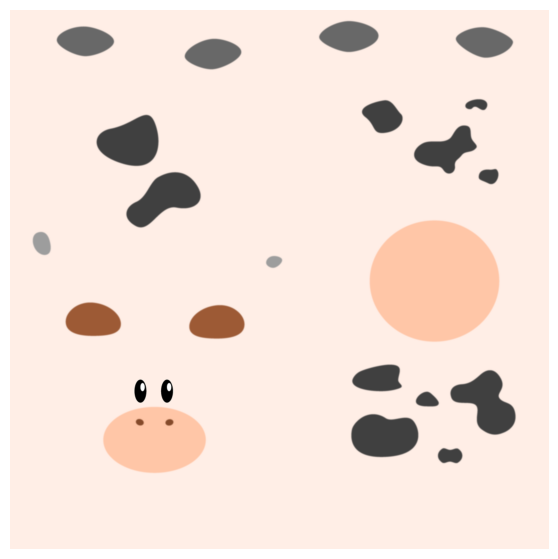

In [4]:
plt.figure(figsize=(7, 7))
texture_image = mesh.textures.maps_padded()
plt.imshow(texture_image.squeeze().cpu().numpy())
plt.grid("off")
plt.axis("off")

(-0.5, 1023.5, 1023.5, -0.5)

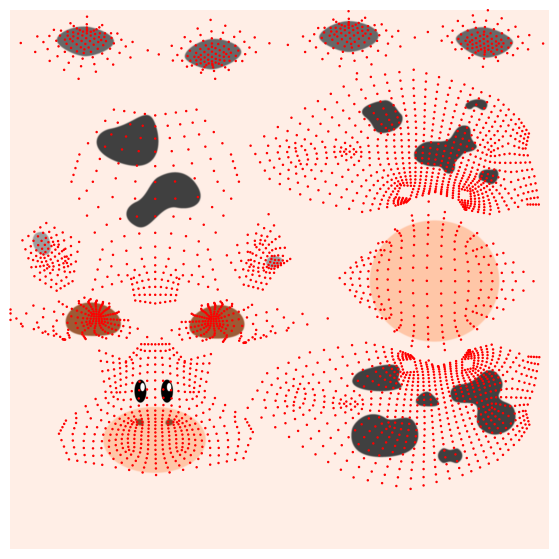

In [15]:
plt.figure(figsize=(7, 7))
texturesuv_image_matplotlib(mesh.textures, subsample=None)
plt.axis("off")

In [4]:
R, T = look_at_view_transform(2.7, 0, 180)
cameras = FoVPerspectiveCameras(device=device, R=R, T=T)

raster_settings = RasterizationSettings(
    image_size=512, blur_radius=0.0, faces_per_pixel=1, bin_size=0
)

lights = PointLights(device=device, location=[[0.0, 0.0, -3.0]])

renderer = MeshRenderer(
    rasterizer=MeshRasterizer(cameras=cameras, raster_settings=raster_settings),
    shader=SoftPhongShader(device=device, cameras=cameras, lights=lights),
)

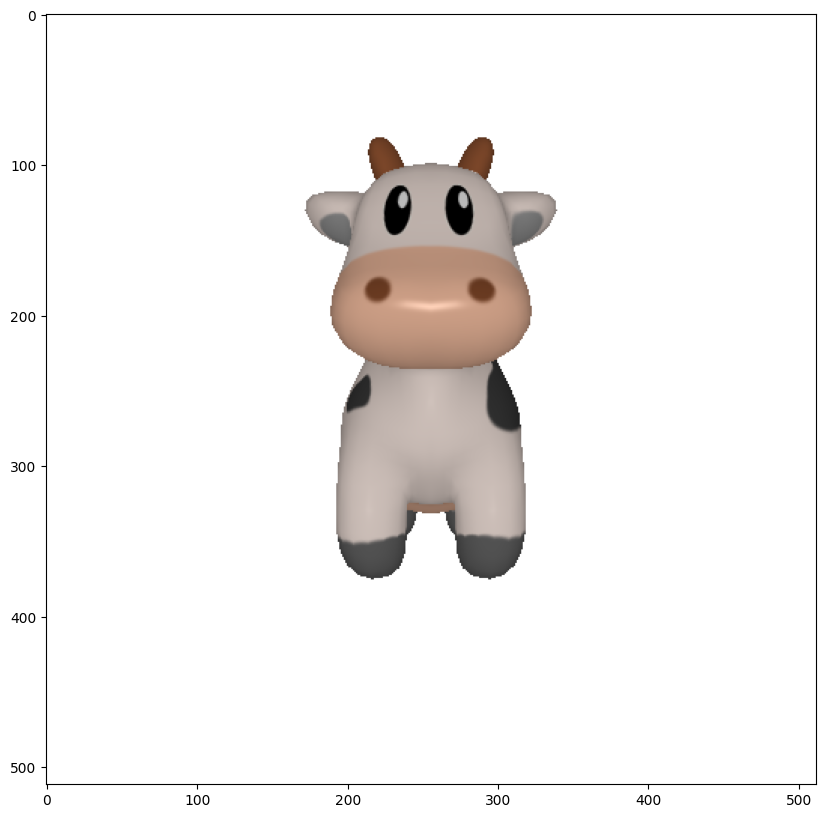

In [6]:
images = renderer(mesh)
plt.figure(figsize=(10, 10))
plt.imshow(images[0, ..., :3].cpu().numpy())
# plt.grid("off")

In [30]:
lights.location = torch.tensor([[0.0, 0.0, 2.0]], device=device)
images = renderer(mesh, lights=lights)

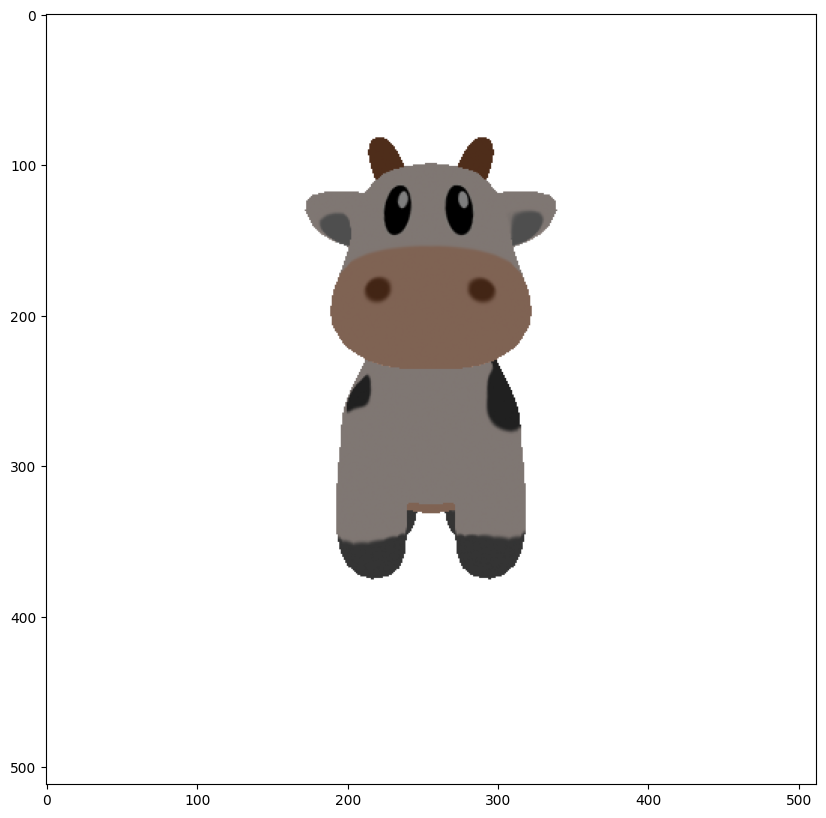

In [31]:
plt.figure(figsize=(10, 10))
plt.imshow(images[0, ..., :3].cpu().numpy())

In [44]:
R, T = look_at_view_transform(dist=2.7, elev=10, azim=-150)
cameras = FoVPerspectiveCameras(device=device, R=R, T=T)

lights.location = torch.tensor([[2.0, 2.0, -2.0]], device=device)

materials = Materials(device=device, specular_color=[[0.0, 1.0, 1.0]], shininess=10.0)

images = renderer(mesh, lights=lights, materials=materials, cameras=cameras)

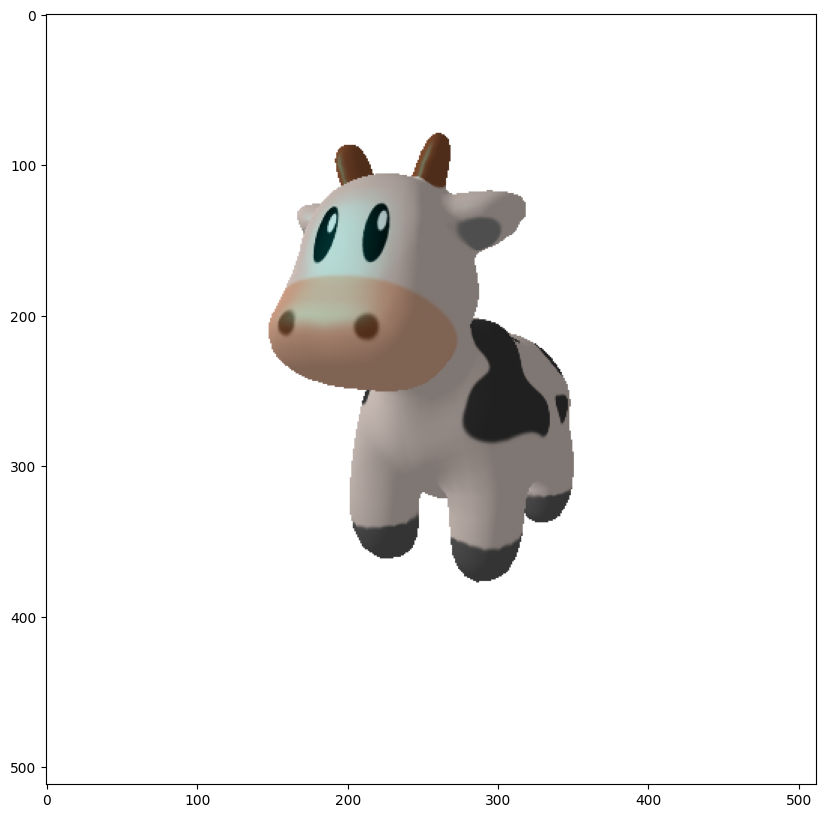

In [45]:
plt.figure(figsize=(10, 10))
plt.imshow(images[0, ..., :3].cpu().numpy())

In [7]:
batch_size = 20

meshes = mesh.extend(batch_size)

elev = torch.linspace(0, 180, batch_size)
azim = torch.linspace(-180, 180, batch_size)

R, T = look_at_view_transform(dist=2.7, elev=elev, azim=azim)
cameras = FoVPerspectiveCameras(device=device, R=R, T=T)

lights = PointLights(device=device, location=[[0.0, 0.0, -3.0]])

In [8]:
images = renderer(meshes, cameras=cameras, lights=lights)

In [10]:
from utils.plot_image_grid import image_grid

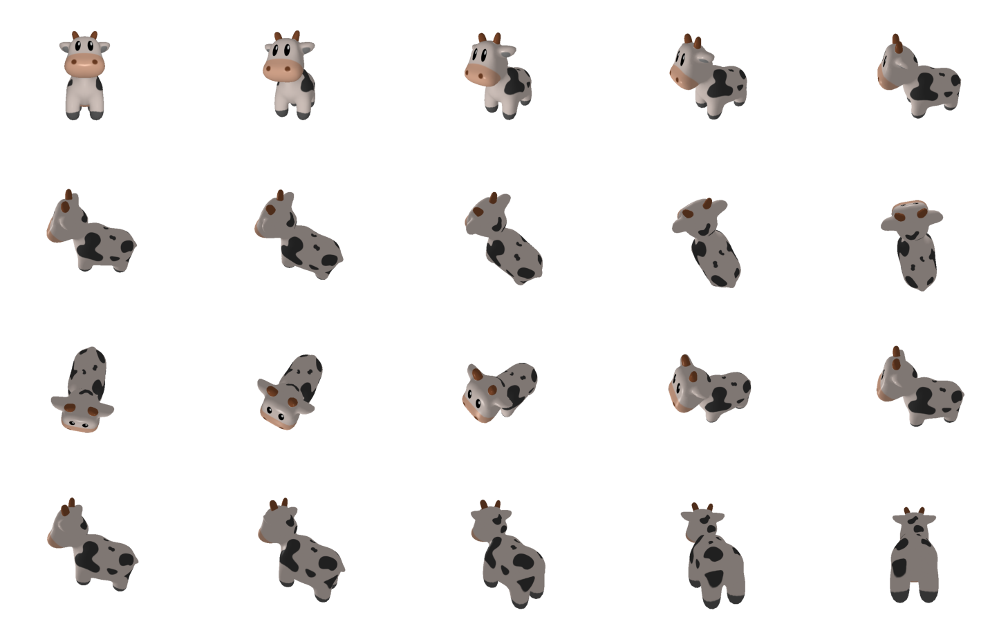

In [11]:
image_grid(images.cpu().numpy(), rows=4, cols=5, rgb=True)

In [5]:
verts, faces_idx, _ = load_obj(obj_filename)
faces = faces_idx.verts_idx

verts_rgb = torch.ones_like(verts)[None]  # (1, V, 3)
textures = TexturesVertex(verts_features=verts_rgb.to(device))

mesh = Meshes(verts=[verts.to(device)], faces=[faces.to(device)], textures=textures)

fig = plot_scene(
    {
        "subplot1": {
            "cow_mesh": mesh,
        }
    }
)
fig.show()

An exception occurred in telemetry logging.Disabling telemetry to prevent further exceptions.
Traceback (most recent call last):
  File "/opt/homebrew/anaconda3/envs/NIE/lib/python3.10/site-packages/iopath/common/file_io.py", line 946, in __log_tmetry_keys
    handler.log_event()
  File "/opt/homebrew/anaconda3/envs/NIE/lib/python3.10/site-packages/iopath/common/event_logger.py", line 97, in log_event
    del self._evt
AttributeError: _evt


In [8]:
# use Plotly's default colors (no texture)
mesh = Meshes(verts=[verts.to(device)], faces=[faces.to(device)])

# Render the plotly figure
fig = plot_scene({"subplot1": {"cow_mesh": mesh}})
fig.show()

In [9]:
mesh_batch = Meshes(
    verts=[verts.to(device), (verts + 2).to(device)],   
    faces=[faces.to(device), faces.to(device)]
)

# plot mesh batch in the same trace
fig = plot_scene({
    "subplot1": {
        "cow_mesh_batch": mesh_batch
    }
})
fig.show()

In [10]:
# plot batch of meshes in different traces
fig = plot_scene({
    "subplot1": {
        "cow_mesh1": mesh_batch[0],
        "cow_mesh2": mesh_batch[1]
    }
})
fig.show()

In [11]:
# plot batch of meshes in different subplots
fig = plot_scene({
    "subplot1": {
        "cow_mesh1": mesh_batch[0]
    },
    "subplot2":{
        "cow_mesh2": mesh_batch[1]
    }
})
fig.show()

In [12]:
# extend the batch to have 4 meshes
mesh_4 = mesh_batch.extend(2)

# visualize the batch in different subplots, 2 per row
fig = plot_batch_individually(mesh_4)
# we can update the figure height and width
fig.update_layout(height=1000, width=500)
fig.show()

In [13]:
fig2 = plot_scene({
    "cow_plot1": {
        "cows": mesh_batch
    }
},
    xaxis={"backgroundcolor":"rgb(200, 200, 230)"},
    yaxis={"backgroundcolor":"rgb(230, 200, 200)"},
    zaxis={"backgroundcolor":"rgb(200, 230, 200)"}, 
    axis_args=AxisArgs(showgrid=True))
fig2.show()

In [14]:
fig3 = plot_batch_individually(
    mesh_4,
    ncols=2,
    subplot_titles=["cow1", "cow2", "cow3", "cow4"],  # customize subplot titles
    xaxis={"backgroundcolor": "rgb(200, 200, 230)"},
    yaxis={"backgroundcolor": "rgb(230, 200, 200)"},
    zaxis={"backgroundcolor": "rgb(200, 230, 200)"},
    axis_args=AxisArgs(showgrid=True),
)
fig3.show()